In [1]:
%pip install folium

Note: you may need to restart the kernel to use updated packages.


In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [23]:
df = pd.read_csv('Dataset.csv')
df["Cuisines"].fillna("unknown")
rows,columns=df.shape
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [24]:
boolean_list = ["Has Table booking", "Has Online delivery", "Is delivering now", "Switch to order menu"]

def boolean_replace(value):
    if value == "Yes":
        return 1
    elif value == "No":
        return 0
    else:
        return value  
df[boolean_list] = df[boolean_list].applymap(boolean_replace)

df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),1,0,0,0,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),1,0,0,0,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),1,0,0,0,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),0,0,0,0,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),1,0,0,0,4,4.8,Dark Green,Excellent,229


In [25]:
a = ["Restaurant Name", "city", "Address","Locality","Locality Verbose","Cuisines"]
a = ["Restaurant Name", "City", "Address","Locality","Locality Verbose","Cuisines"]
from unidecode import unidecode
def clean_text(text):
    if isinstance(text, str):
        return unidecode(text)
    return text
df[a] = df[a].applymap(clean_text)
df.tail()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
9546,5915730,Naml1 Gurme,208,stanbul,"Kemanke Karamustafa Paa Mahallesi, R1ht1m Cadd...",Karak_y,"Karak_y, stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),0,0,0,0,3,4.1,Green,Very Good,788
9547,5908749,Ceviz Aac1,208,stanbul,"Kouyolu Mahallesi, Muhittin st_nda Caddesi, No...",Kouyolu,"Kouyolu, stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),0,0,0,0,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,stanbul,"Kuru_eme Mahallesi, Muallim Naci Caddesi, No 5...",Kuru_eme,"Kuru_eme, stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),0,0,0,0,4,3.7,Yellow,Good,661
9549,5916112,Ak Kahve,208,stanbul,"Kuru_eme Mahallesi, Muallim Naci Caddesi, No 6...",Kuru_eme,"Kuru_eme, stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),0,0,0,0,4,4.0,Green,Very Good,901
9550,5927402,Walter's Coffee Roastery,208,stanbul,"Cafeaa Mahallesi, Bademalt1 Sokak, No 21/B, Ka...",Moda,"Moda, stanbul",29.026016,40.984776,Cafe,...,Turkish Lira(TL),0,0,0,0,2,4.0,Green,Very Good,591


In [26]:
rating_scale = {
    'Excellent':10,
    'Very Good':8,
    'Good'     :7,
    'Average'  :5,
    'Not rated':0,
    'Poor'     :2
}
for i in range(rows):
    if df.loc[i,"Rating text"] in rating_scale.keys():
        df.loc[i,"Rating text"]=rating_scale[df.loc[i,"Rating text"]]
df["Rating text"].astype(int)
df.head()
df.to_csv("ready.csv", index=False)


In [27]:
d1= pd.read_csv("ready.csv")

In [28]:
d1['Cuisines'].fillna('unknown',inplace=True)
d1.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),1,0,0,0,3,4.8,Dark Green,10,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),1,0,0,0,3,4.5,Dark Green,10,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),1,0,0,0,4,4.4,Green,8,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),0,0,0,0,4,4.9,Dark Green,10,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),1,0,0,0,4,4.8,Dark Green,10,229


In [29]:
restaurant_map = folium.Map(location = [d1['Latitude'].mean(),d1['Longitude'].mean()],zoom_start=10)

In [30]:
for index, row in d1.iterrows():
     folium.CircleMarker( 
        location=[row['Latitude'], row['Longitude']],
        radius = 5,
        color = 'red',
        fill = True,
        fill_color = 'green',
        fill_opacity = 0.6,
        popup = row['Restaurant Name']).add_to(restaurant_map)

In [31]:
restaurant_map

In [32]:
restaurant_map.save('restaurant_distribution.html')

In [33]:
grouped = d1.groupby('Locality')
count_by_city = grouped.size().reset_index(name = "Restaurant Count")
count_by_city

,Locality,Restaurant Count
0,"ILD Trade Centre Mall, Sohna Road",2
1,"12th Square Building, Banjara Hills",1
2,"A Hotel, Gurdev Nagar",1
3,"ARSS Mall, Paschim Vihar",1
4,Aaya Nagar,1
...,...,...
1203,ayyolu,1
1204,guas Claras,3
1205,"ibis New Delhi, Aerocity",2
1206,mitk_y,1


In [34]:
average_rating_by_city = grouped['Aggregate rating'].mean().reset_index(name = 'Average Rating')
average_price_by_city = grouped['Average Cost for two'].mean().reset_index(name = 'Average Price')
average_price_by_city

,Locality,Average Price
0,"ILD Trade Centre Mall, Sohna Road",575.000000
1,"12th Square Building, Banjara Hills",1500.000000
2,"A Hotel, Gurdev Nagar",800.000000
3,"ARSS Mall, Paschim Vihar",500.000000
4,Aaya Nagar,500.000000
...,...,...
1203,ayyolu,35.000000
1204,guas Claras,86.666667
1205,"ibis New Delhi, Aerocity",900.000000
1206,mitk_y,70.000000


In [35]:
Locality_with_highest_rating = average_rating_by_city[average_rating_by_city['Average Rating'] == average_rating_by_city['Average Rating'].max()]
Locality_with_highest_rating

,Locality,Average Rating
47,Aminabad,4.9
103,"Barwa Towers, Al Sadd",4.9
108,"Beak Street, Soho",4.9
110,Bebek,4.9
123,"Bishopsgate, City Of London",4.9
153,Caddebostan,4.9
165,Cengkareng,4.9
203,City and Suburban,4.9
244,DIFC,4.9
276,Deira City Centre Area,4.9


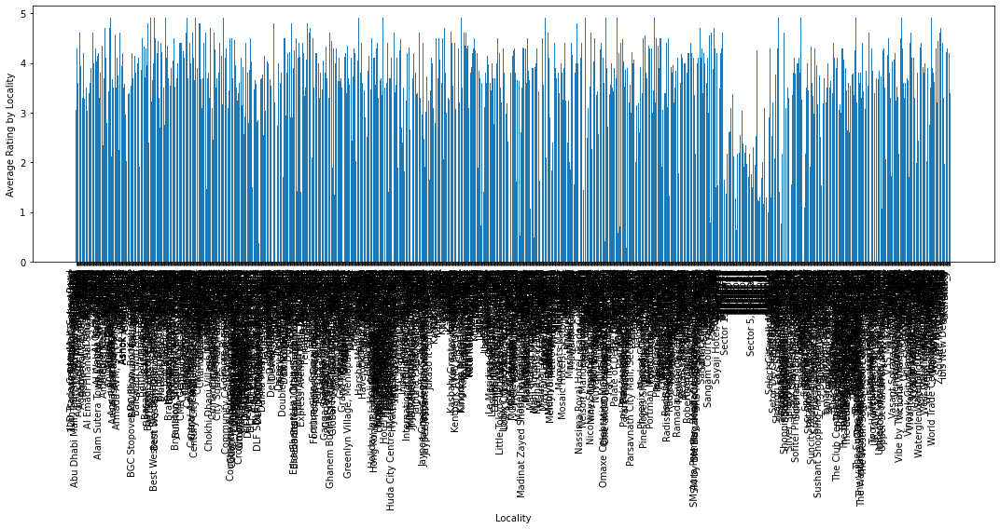

In [36]:
plt.figure(figsize=(15,8))
plt.bar(average_rating_by_city['Locality'], average_rating_by_city['Average Rating'])
plt.xlabel('Locality')
plt.ylabel('Average Rating by Locality')
plt.xticks(rotation = 90, ha = 'right')
plt.tight_layout()
plt.show()